In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sns
import statsmodels.api as sm
from itertools import combinations
%matplotlib inline

from collections import namedtuple
from importlib import reload
from matplotlib import cm
from imblearn.under_sampling import TomekLinks, RandomUnderSampler
from imblearn.over_sampling import SMOTE

from sklearn.model_selection import train_test_split
from sklearn.metrics import (make_scorer, roc_auc_score, 
                             classification_report, 
                             precision_recall_curve,
                             roc_curve)
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KernelDensity
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression

from xgboost import XGBClassifier

import warnings
warnings.simplefilter("ignore", category=PendingDeprecationWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)

/home/ryohayama/.local/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


In [2]:
import sys
sys.path.append('/home/ryohayama/python_current/BasicFeatureAnalysis')

import feature as F
import feature_collection as FC

In [3]:
import ps.joint_probability as psjp

In [4]:
train = pd.read_csv('train.csv', header=0)

all_fs = train.columns[2:]

binary_fs = sorted([f for f in all_fs if '_bin' in f])

categorical_fs = sorted([f for f in all_fs if '_cat' in f])

other_fs = sorted([f for f in all_fs
                if f not in binary_fs
                if f not in categorical_fs])

target = train.target

In [5]:
train.columns

Index(['id', 'target', 'ps_ind_01', 'ps_ind_02_cat', 'ps_ind_03',
       'ps_ind_04_cat', 'ps_ind_05_cat', 'ps_ind_06_bin', 'ps_ind_07_bin',
       'ps_ind_08_bin', 'ps_ind_09_bin', 'ps_ind_10_bin', 'ps_ind_11_bin',
       'ps_ind_12_bin', 'ps_ind_13_bin', 'ps_ind_14', 'ps_ind_15',
       'ps_ind_16_bin', 'ps_ind_17_bin', 'ps_ind_18_bin', 'ps_reg_01',
       'ps_reg_02', 'ps_reg_03', 'ps_car_01_cat', 'ps_car_02_cat',
       'ps_car_03_cat', 'ps_car_04_cat', 'ps_car_05_cat', 'ps_car_06_cat',
       'ps_car_07_cat', 'ps_car_08_cat', 'ps_car_09_cat', 'ps_car_10_cat',
       'ps_car_11_cat', 'ps_car_11', 'ps_car_12', 'ps_car_13', 'ps_car_14',
       'ps_car_15', 'ps_calc_01', 'ps_calc_02', 'ps_calc_03', 'ps_calc_04',
       'ps_calc_05', 'ps_calc_06', 'ps_calc_07', 'ps_calc_08', 'ps_calc_09',
       'ps_calc_10', 'ps_calc_11', 'ps_calc_12', 'ps_calc_13', 'ps_calc_14',
       'ps_calc_15_bin', 'ps_calc_16_bin', 'ps_calc_17_bin', 'ps_calc_18_bin',
       'ps_calc_19_bin', 'ps_calc_20_bin'],


In [6]:
used_fs = other_fs.copy()
used_fs.remove('ps_calc_01')
used_fs.remove('ps_calc_02')
used_fs.remove('ps_calc_03')
used_fs.remove('ps_calc_04')
used_fs.remove('ps_calc_06')
used_fs.remove('ps_calc_08')
used_fs.remove('ps_calc_09')

In [7]:
conts = train[used_fs + ['target']]
conts.columns

Index(['ps_calc_05', 'ps_calc_07', 'ps_calc_10', 'ps_calc_11', 'ps_calc_12',
       'ps_calc_13', 'ps_calc_14', 'ps_car_11', 'ps_car_12', 'ps_car_13',
       'ps_car_14', 'ps_car_15', 'ps_ind_01', 'ps_ind_03', 'ps_ind_14',
       'ps_ind_15', 'ps_reg_01', 'ps_reg_02', 'ps_reg_03', 'target'],
      dtype='object')

In [8]:
conts.shape

(595212, 20)

In [9]:
conts = conts.replace({-1:np.NaN}).dropna()

In [10]:
conts.shape

(453046, 20)

In [11]:
y = np.array(conts.target)
y.shape

(453046,)

# Pairwise Plot of Continuous Features

In [25]:
feature_pair_list = list(combinations(used_fs, 2))

In [26]:
pair_list1 = feature_pair_list[:90]
pair_list2 = feature_pair_list[90:]

## Plot both classes

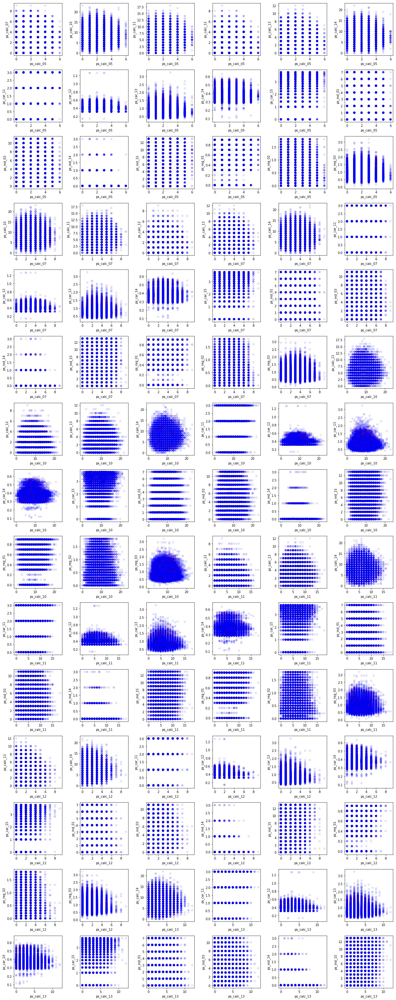

In [29]:
num_plot= 50000
fig = plt.figure(figsize=(18, 45))
for i, pair in enumerate(pair_list1):
    x0 = np.array(conts[pair[0]])
    x1 = np.array(conts[pair[1]])
    
    ax = fig.add_subplot(15, 6, i+1)
    ax.scatter(x0[:num_plot], x1[:num_plot], c=y[:num_plot], cmap=cm.bwr, alpha=0.1)
    ax.set_xlabel(pair[0])
    ax.set_ylabel(pair[1])
plt.tight_layout()

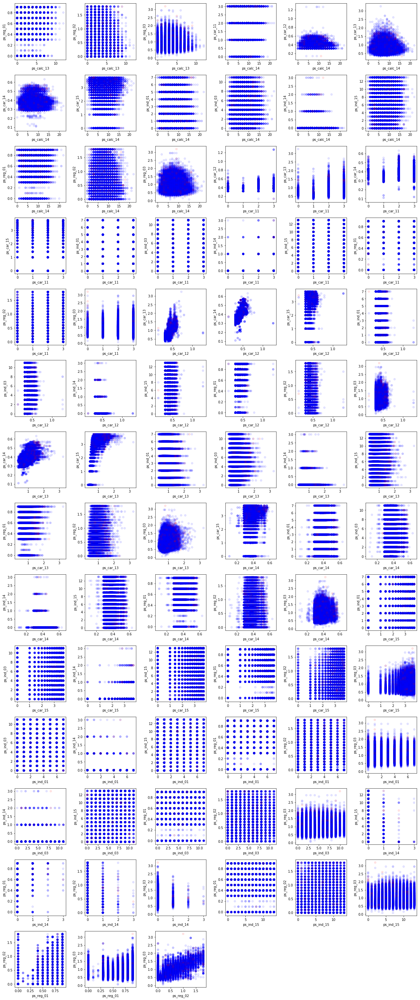

In [30]:
num_plot= 50000
fig = plt.figure(figsize=(18, 45))
for i, pair in enumerate(pair_list2):
    x0 = np.array(conts[pair[0]])
    x1 = np.array(conts[pair[1]])
    
    ax = fig.add_subplot(15, 6, i+1)
    ax.scatter(x0[:num_plot], x1[:num_plot], c=y[:num_plot], cmap=cm.bwr, alpha=0.1)
    ax.set_xlabel(pair[0])
    ax.set_ylabel(pair[1])
plt.tight_layout()

## Plot Class1 alone

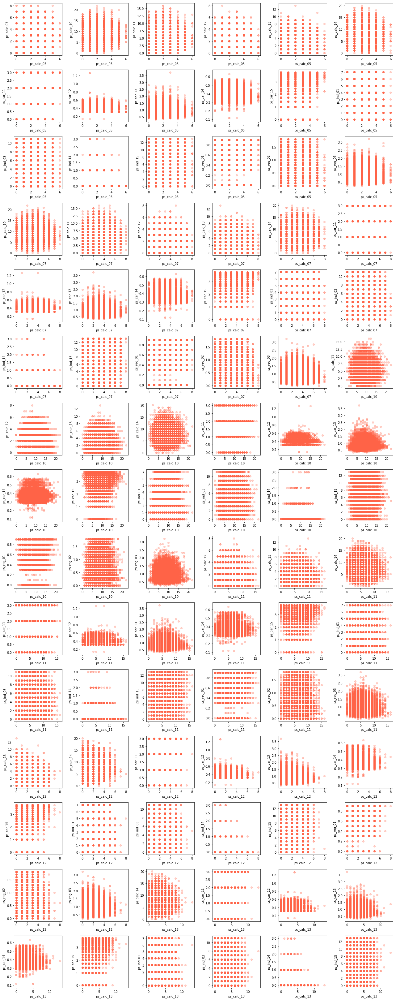

In [31]:
num_plot= 50000
target_index = np.argwhere(y == 1)
fig = plt.figure(figsize=(18, 45))
for i, pair in enumerate(pair_list1):
    x0 = np.array(conts[pair[0]])
    x1 = np.array(conts[pair[1]])
    
    ax = fig.add_subplot(15, 6, i+1)
    ax.scatter(x0[target_index], x1[target_index], color='tomato', alpha=0.3)
    ax.set_xlabel(pair[0])
    ax.set_ylabel(pair[1])
plt.tight_layout()

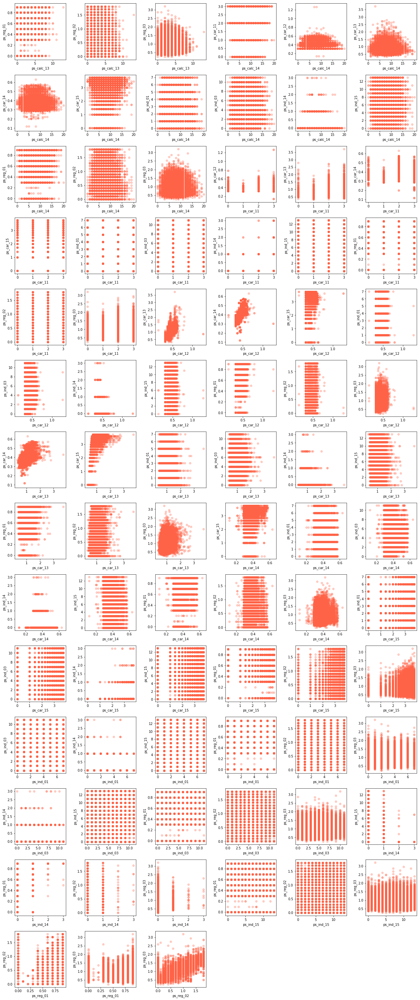

In [32]:
num_plot= 50000
target_index = np.argwhere(y == 1)
fig = plt.figure(figsize=(18, 45))
for i, pair in enumerate(pair_list2):
    x0 = np.array(conts[pair[0]])
    x1 = np.array(conts[pair[1]])
    
    ax = fig.add_subplot(15, 6, i+1)
    ax.scatter(x0[target_index], x1[target_index], color='tomato', alpha=0.3)
    ax.set_xlabel(pair[0])
    ax.set_ylabel(pair[1])
plt.tight_layout()

## PCA space

In [24]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, QuantileTransformer

In [35]:
scaler = QuantileTransformer()
X = scaler.fit_transform(np.array(conts[used_fs]))

In [36]:
pca = PCA()
Xpca = pca.fit_transform(X)

pca_labels = [('component_' + str(i)) for i in range(Xpca.shape[1])]
conts_pca = pd.DataFrame(Xpca, columns=pca_labels)

In [37]:
conts_pca.head()

,component_0,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10,component_11,component_12,component_13,component_14,component_15,component_16,component_17,component_18
0,0.009092,-0.377681,0.411271,0.047308,-0.352538,-0.028282,-0.210995,0.248026,-0.002014,0.493180,0.438661,-0.190077,0.435438,0.030720,-0.195967,0.074538,0.043772,-0.008355,-0.057979
1,0.218574,0.279382,-0.299215,0.244908,0.353081,-0.111090,-0.049131,0.300103,0.219649,-0.513798,0.085289,0.173081,-0.338870,-0.026516,0.484764,-0.289040,-0.048513,-0.000590,0.041375
2,0.728426,0.620988,0.172442,-0.454716,0.178350,0.200650,-0.265754,-0.393697,0.414408,0.117641,0.293520,0.558844,0.403070,0.279705,-0.233697,0.459449,0.048598,-0.043701,-0.031078
3,0.494446,0.400359,-0.592971,-0.042901,0.108866,-0.070013,0.580330,-0.103134,0.126211,-0.290934,-0.689243,0.001976,-0.076082,0.325294,-0.199746,-0.144829,-0.123021,0.022755,0.107978
4,-0.882297,0.344426,0.529462,0.014483,0.318947,0.189866,0.173693,0.212787,0.100561,-0.565390,0.011190,0.012842,0.305128,-0.048595,-0.016836,0.064908,0.036024,-0.008119,0.048602


In [38]:
pca_pair_list = list(combinations(conts_pca.columns, 2))
pca_pair_list1 = pca_pair_list[:95]
pca_pair_list2 = pca_pair_list[95:]
print(len(pca_pair_list1))
print(len(pca_pair_list2))

95
76


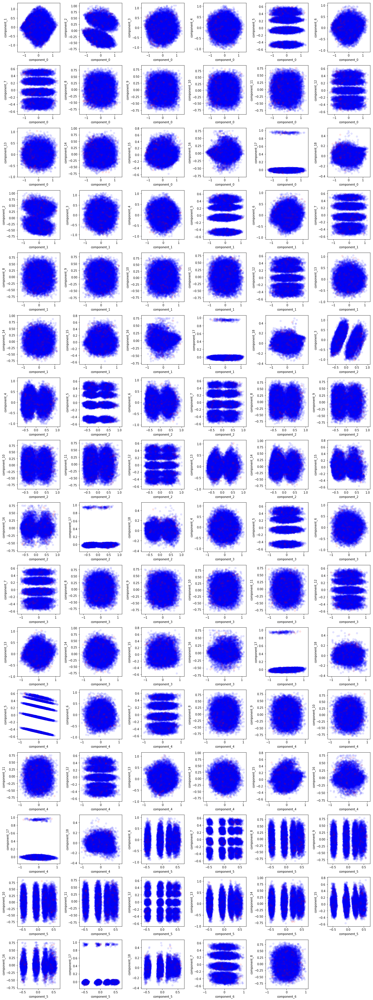

In [39]:
num_plot= 20000
fig = plt.figure(figsize=(18, 48))
for i, pair in enumerate(pca_pair_list1):
    x0 = np.array(conts_pca[pair[0]])
    x1 = np.array(conts_pca[pair[1]])
    
    ax = fig.add_subplot(16, 6, i+1)
    ax.scatter(x0[:num_plot], x1[:num_plot], c=y[:num_plot], cmap=cm.bwr, alpha=0.1)
    ax.set_xlabel(pair[0])
    ax.set_ylabel(pair[1])
plt.tight_layout()

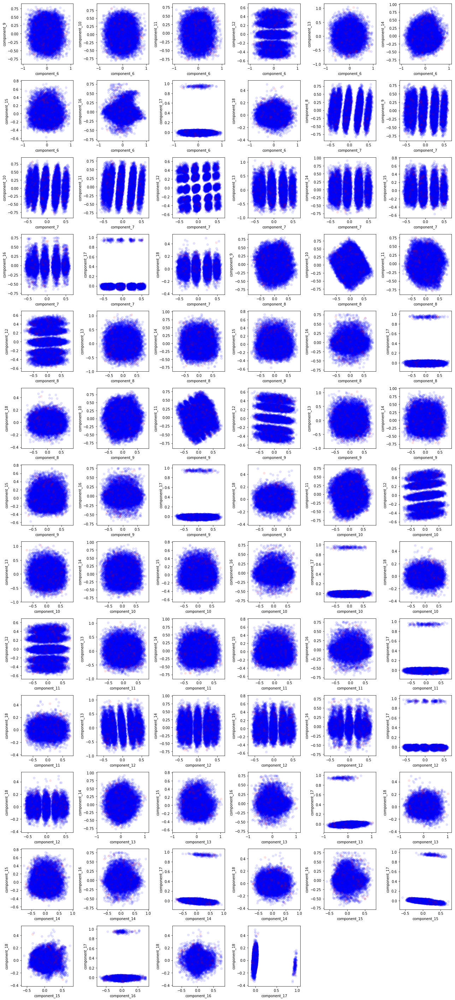

In [40]:
num_plot= 20000
fig = plt.figure(figsize=(18, 48))
for i, pair in enumerate(pca_pair_list2):
    x0 = np.array(conts_pca[pair[0]])
    x1 = np.array(conts_pca[pair[1]])
    
    ax = fig.add_subplot(16, 6, i+1)
    ax.scatter(x0[:num_plot], x1[:num_plot], c=y[:num_plot], cmap=cm.bwr, alpha=0.1)
    ax.set_xlabel(pair[0])
    ax.set_ylabel(pair[1])
plt.tight_layout()